In [ ]:
# -*- coding: utf-8 -*-
"""Join_BusinessPayments.ipynb

Automatically generated by Colab.

Original file is located at
    https://colab.research.google.com/github/Layola27/Proyecto2-IA/blob/Gerard/Join_BusinessPayments.ipynb
"""

from google.colab import drive
drive.mount('/content/drive')

# Importando la biblioteca pandas para manipulación y análisis de datos
import pandas as pd

# Cargar los datos
cash_request_path = 'drive/MyDrive/ColabNotebooks/Business_Payments/extract - cash request - data analyst.csv'
fees_path = 'drive/MyDrive/ColabNotebooks/Business_Payments/extract - fees - data analyst - .csv'
output_path = 'drive/MyDrive/ColabNotebooks/Business_Payments/merged_inner.csv'

# Leer los datasets
cash_request = pd.read_csv(cash_request_path)
fees = pd.read_csv(fees_path)

# Renombrar columnas conflictivas en cash_request
cash_request_renamed = cash_request.rename(columns={
    'created_at': 'cash_request_created_at',
    'updated_at': 'cash_request_updated_at',
    'status': 'cash_request_status',
    'id': 'cash_request_id'
})

# Realizar el Inner Join
inner_join = fees.merge(cash_request_renamed, how='inner', left_on='cash_request_id', right_on='cash_request_id')

# Guardar el resultado en la misma ruta
inner_join.to_csv(output_path, index=False)

print(f"El archivo resultado del Inner Join se ha guardado en: {output_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
El archivo resultado del Inner Join se ha guardado en: drive/MyDrive/ColabNotebooks/Business_Payments/merged_inner.csv


In [26]:
# Importando la biblioteca pandas para manipulación y análisis de datos
import pandas as pd

# Importando NumPy para operaciones numéricas y manipulación de arreglos
import numpy as np

# Importando Seaborn para visualización de datos estadísticos (opcional, pero puede complementar a Plotly)
import seaborn as sns

# Importando Plotly Express para visualizaciones interactivas de alto nivel y fáciles de usar
import plotly.express as px

# Importando matplotlib.pyplot para crear gráficos y visualizaciones
import matplotlib.pyplot as plt

# Importando Plotly Graph Objects para un control más detallado sobre las visualizaciones
import plotly.graph_objects as go

# Importando itertools para generar combinaciones de columnas
import itertools

# Importando la función seasonal_decompose para la descomposición de series temporales
from statsmodels.tsa.seasonal import seasonal_decompose

In [27]:
business_payments = pd.read_csv('drive/MyDrive/ColabNotebooks/Business_Payments/merged_inner.csv')

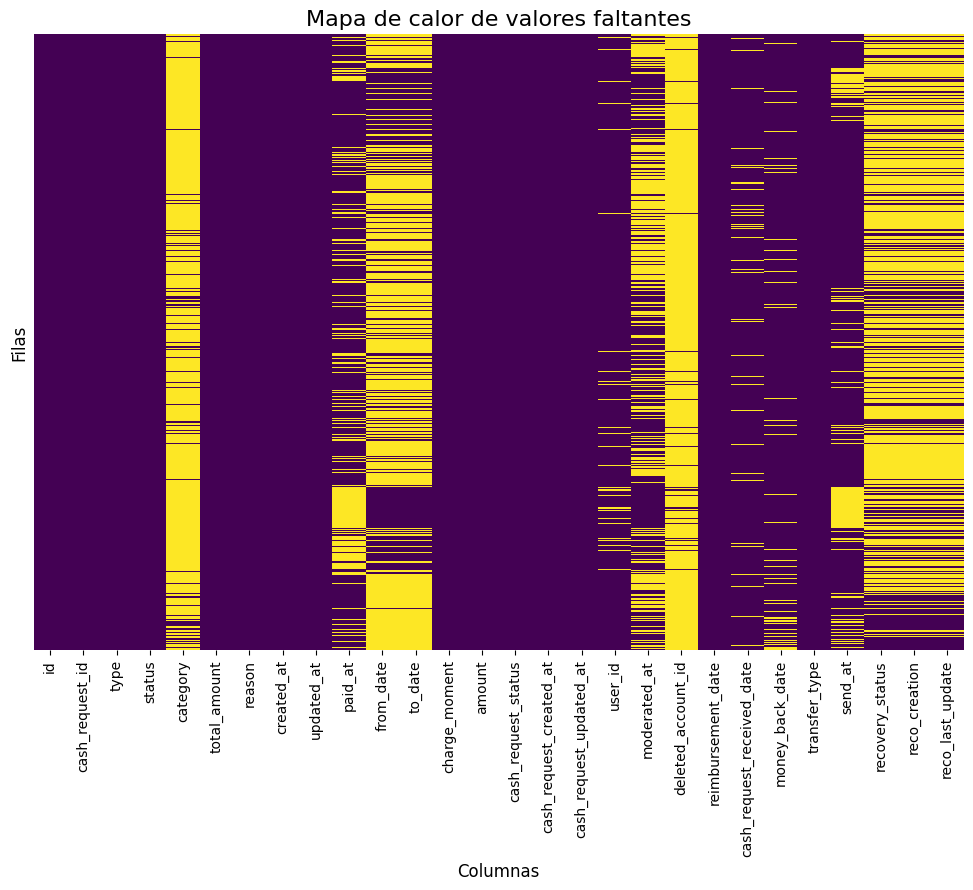

In [29]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Cargar el archivo CSV
business_payments = pd.read_csv('drive/MyDrive/ColabNotebooks/Business_Payments/merged_inner.csv')

# Configurar el tamaño del gráfico
plt.figure(figsize=(12, 8))

# Crear un mapa de calor de los valores faltantes
sns.heatmap(business_payments.isnull(), cbar=False, cmap="viridis", yticklabels=False)

# Agregar título
plt.title("Mapa de calor de valores faltantes", fontsize=16)
plt.xlabel("Columnas", fontsize=12)
plt.ylabel("Filas", fontsize=12)

# Mostrar el gráfico
plt.show()


In [30]:
business_payments.describe()

,id,cash_request_id,total_amount,amount,user_id,deleted_account_id
count,21057.000000,21057.000000,21057.000000,21057.000000,20151.000000,906.000000
mean,10646.670228,16318.449162,5.000237,81.833547,37988.603940,17334.621413
std,6099.136169,6656.149949,0.034457,26.945058,27987.123692,7315.152519
min,1.000000,1456.000000,5.000000,1.000000,47.000000,3857.000000
25%,5388.000000,11745.000000,5.000000,50.000000,14868.000000,11051.000000
50%,10654.000000,17160.000000,5.000000,100.000000,31538.000000,19717.000000
75%,15926.000000,21796.000000,5.000000,100.000000,56357.500000,23322.000000
max,21193.000000,27010.000000,10.000000,200.000000,103503.000000,30445.000000


In [31]:
business_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21057 entries, 0 to 21056
Data columns (total 28 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          21057 non-null  int64  
 1   cash_request_id             21057 non-null  float64
 2   type                        21057 non-null  object 
 3   status                      21057 non-null  object 
 4   category                    2196 non-null   object 
 5   total_amount                21057 non-null  float64
 6   reason                      21057 non-null  object 
 7   created_at                  21057 non-null  object 
 8   updated_at                  21057 non-null  object 
 9   paid_at                     15531 non-null  object 
 10  from_date                   7766 non-null   object 
 11  to_date                     7766 non-null   object 
 12  charge_moment               21057 non-null  object 
 13  amount                      210

In [32]:
# Obteniendo una lista de las columnas del DataFrame
columnas_business_payments = business_payments.columns.tolist()

for i in columnas_business_payments:
    print("===========================")
    print(f"Columna: {i}")
    print(business_payments[i].value_counts().head(10))
    print()

Columna: id
id
6537     1
10103    1
7847     1
7846     1
7844     1
6968     1
7819     1
7816     1
7815     1
9183     1
Name: count, dtype: int64

Columna: cash_request_id
cash_request_id
12225.0    35
5006.0     28
4410.0     24
12452.0    23
11376.0    21
2358.0     19
11746.0    17
15319.0    16
4956.0     15
8713.0     15
Name: count, dtype: int64

Columna: type
type
instant_payment    11095
postpone            7766
incident            2196
Name: count, dtype: int64

Columna: status
status
accepted     14841
cancelled     4934
rejected      1194
confirmed       88
Name: count, dtype: int64

Columna: category
category
rejected_direct_debit     1599
month_delay_on_payment     597
Name: count, dtype: int64

Columna: total_amount
total_amount
5.0     21056
10.0        1
Name: count, dtype: int64

Columna: reason
reason
rejected direct debit               1599
month delay on payment - 9/2020      283
month delay on payment - 8/2020      203
month delay on payment - 10/2020     102


In [34]:
import pandas as pd
import plotly.express as px

# Cargar el dataset
business_payments = pd.read_csv('drive/MyDrive/ColabNotebooks/Business_Payments/merged_inner.csv')

# Obtener una lista de columnas numéricas
columnas_numericas = business_payments.describe().columns.tolist()

# Crear histogramas para cada columna numérica
for columna in columnas_numericas:
    fig = px.histogram(
        business_payments,
        x=columna,
        title=f'Histograma de {columna}',
        template='plotly_white'  # Estilo más limpio
    )
    # Ajustar la altura del gráfico
    fig.update_layout(height=500)
    # Mostrar el gráfico
    fig.show()



In [35]:
import plotly.express as px

# Identificar todas las columnas del dataset
columnas_business_payments = business_payments.columns.tolist()

# Filtrar columnas numéricas
columnas_numericas_business_payments = business_payments.describe().columns.tolist()

# Iterar sobre cada columna para identificar y graficar las categóricas con ≤ 10 valores únicos
for columna in columnas_business_payments:
    if columna not in columnas_numericas_business_payments:
        # Contar la frecuencia de valores únicos en la columna
        counts = business_payments[columna].value_counts()

        # Verificar si la cantidad de valores únicos es menor o igual a 10
        if len(counts) <= 10:
            # Crear un gráfico de pastel para la distribución de la columna
            fig = px.pie(
                names=counts.index,
                values=counts.values,
                title=f'Distribución de {columna}'
            )
            # Ajustar la altura del gráfico
            fig.update_layout(height=300)
            # Mostrar el gráfico
            fig.show()


In [36]:
import plotly.express as px

# Crear diagramas de caja para cada columna numérica
for columna in columnas_numericas_business_payments:
    fig = px.box(
        business_payments,
        y=columna,
        title=f'Boxplot de {columna}',
        template='plotly_white'  # Estilo más limpio
    )
    # Ajustar la altura del gráfico
    fig.update_layout(height=500)
    # Mostrar el gráfico
    fig.show()


In [37]:
import plotly.express as px

# Crear diagramas de violín para cada columna numérica
for columna in columnas_numericas_business_payments:
    fig = px.violin(
        business_payments,
        y=columna,
        title=f'Violinplot de {columna}',
        template='plotly_white'  # Estilo más limpio
    )
    # Ajustar la altura del gráfico
    fig.update_layout(height=500)
    # Mostrar el gráfico
    fig.show()


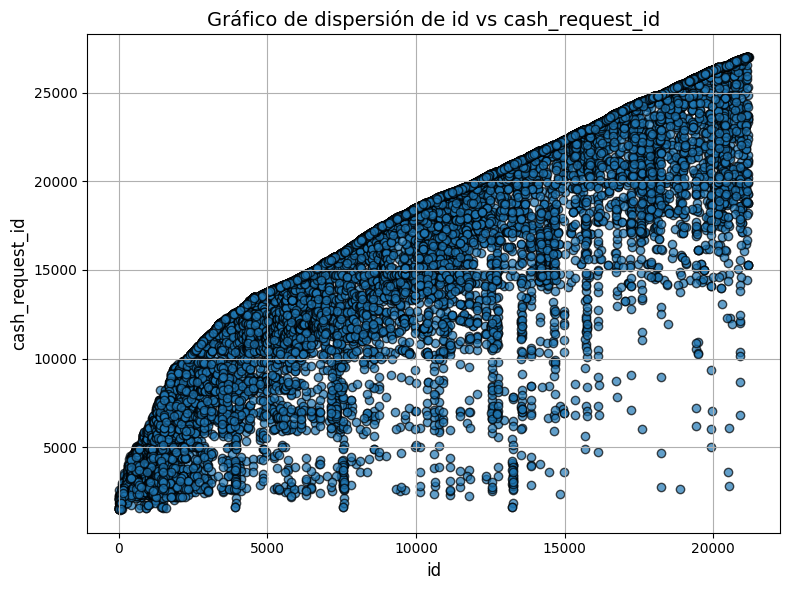

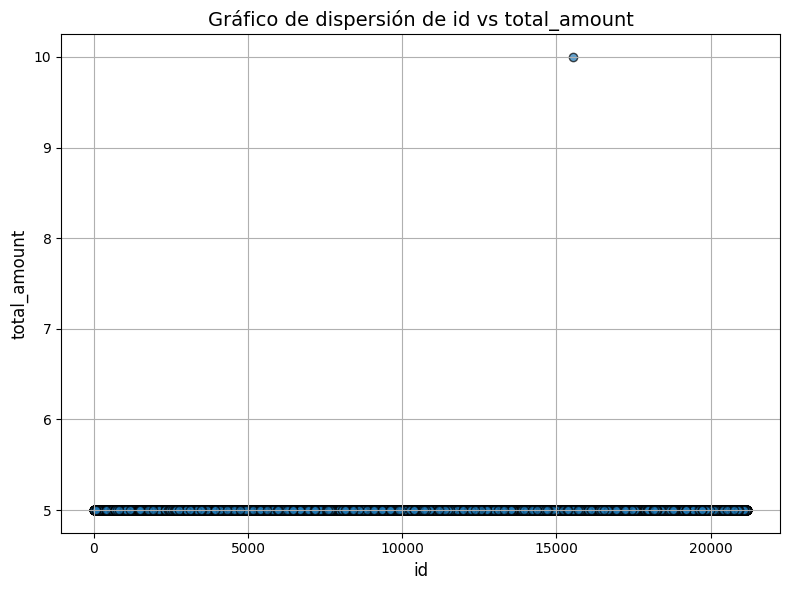

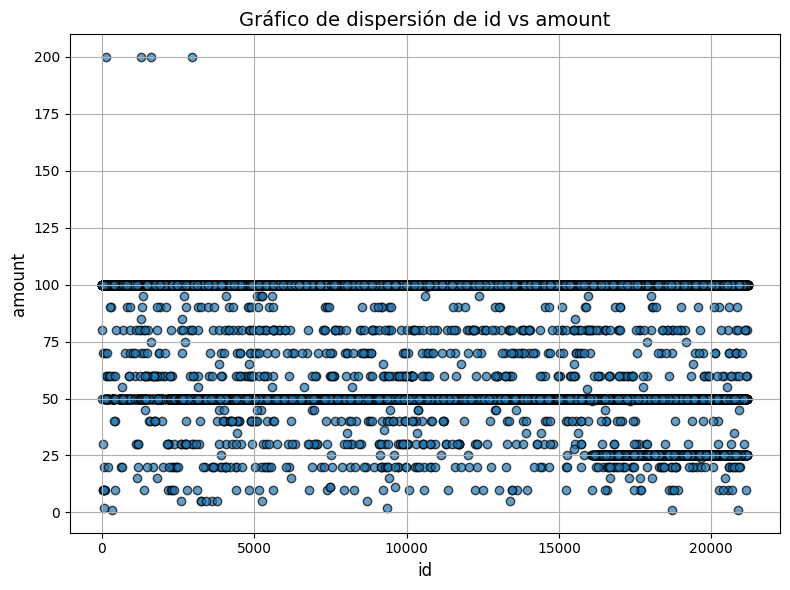

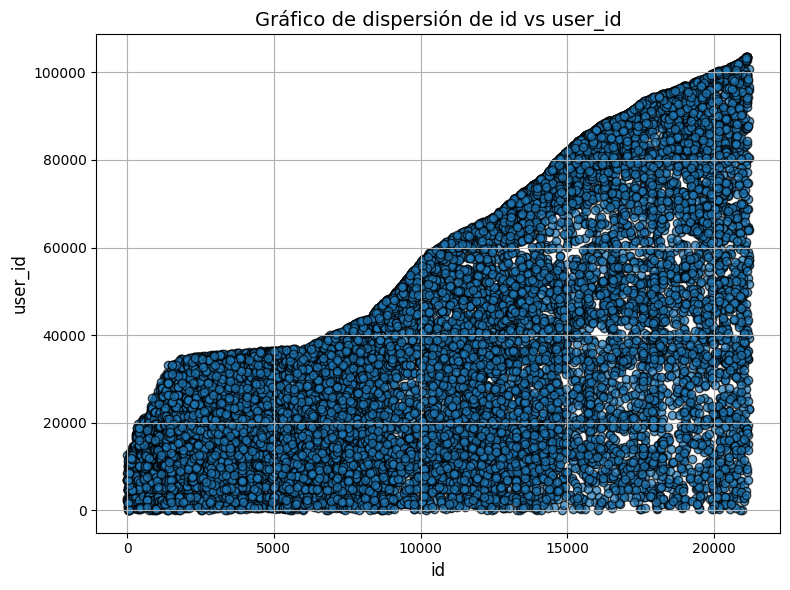

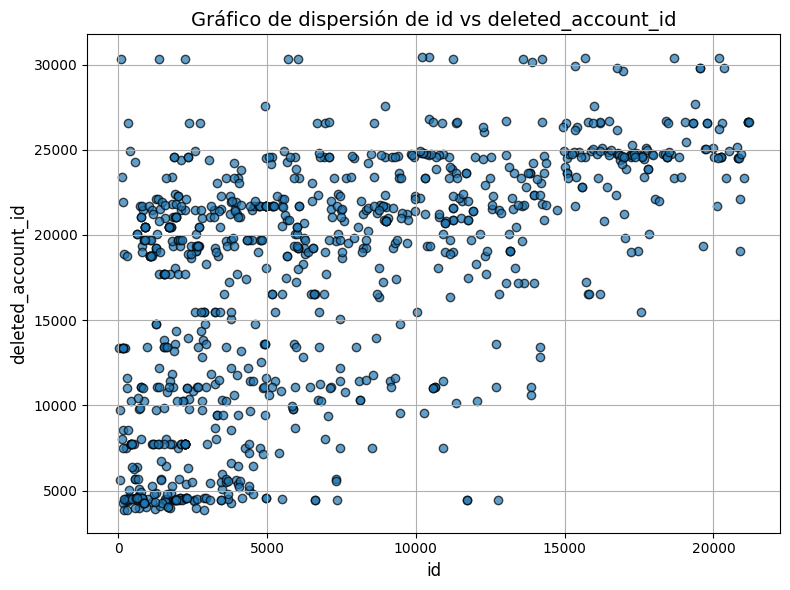

...

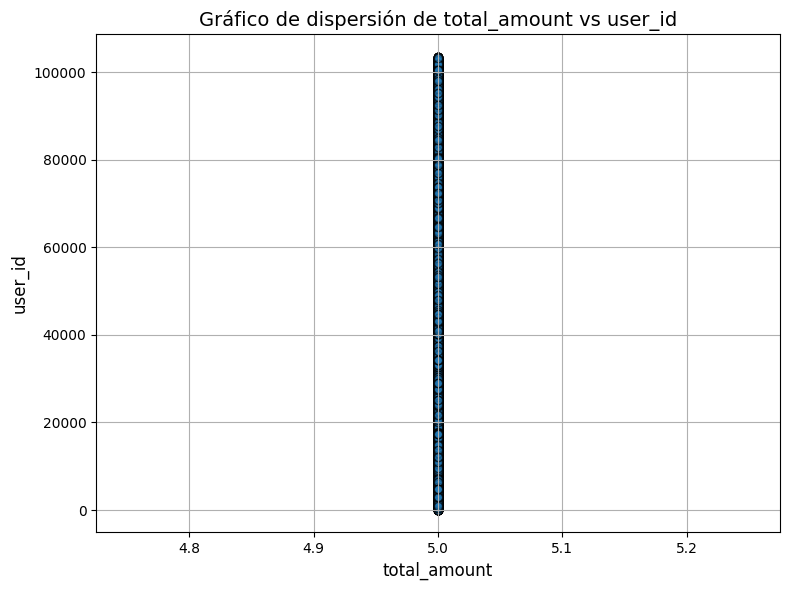

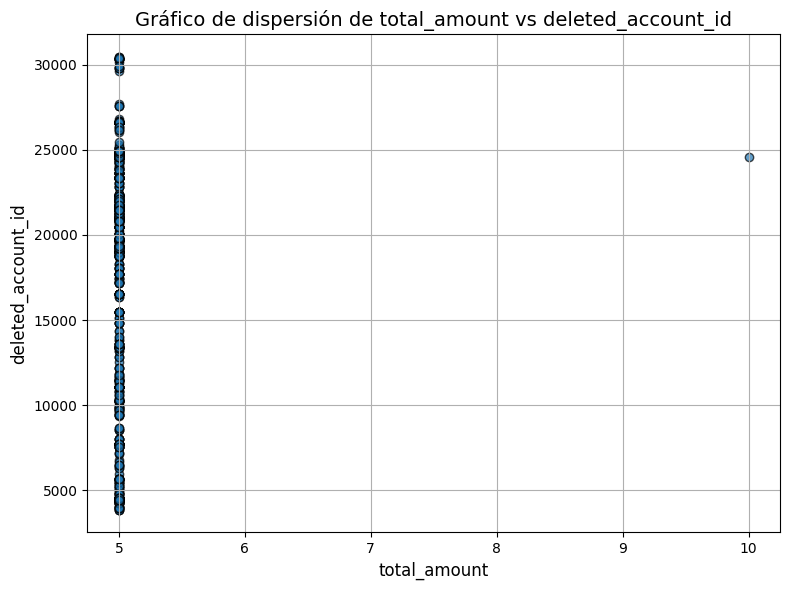

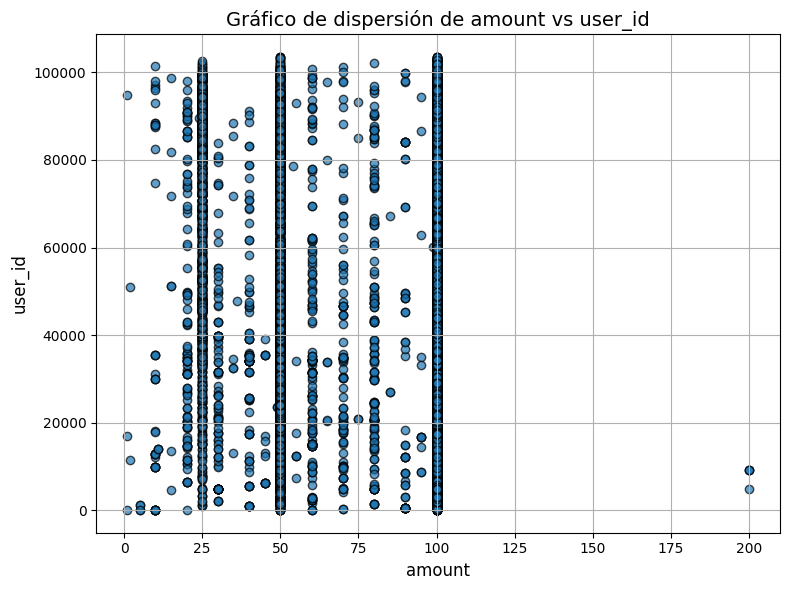

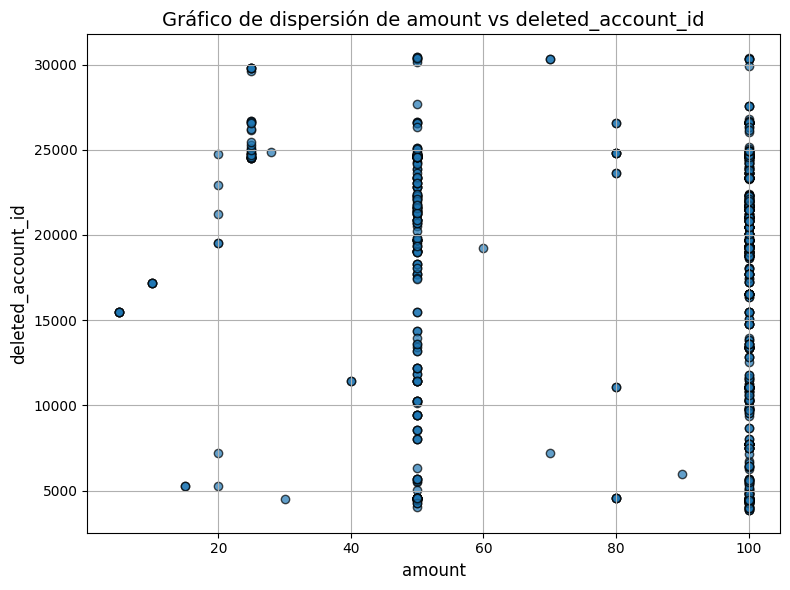

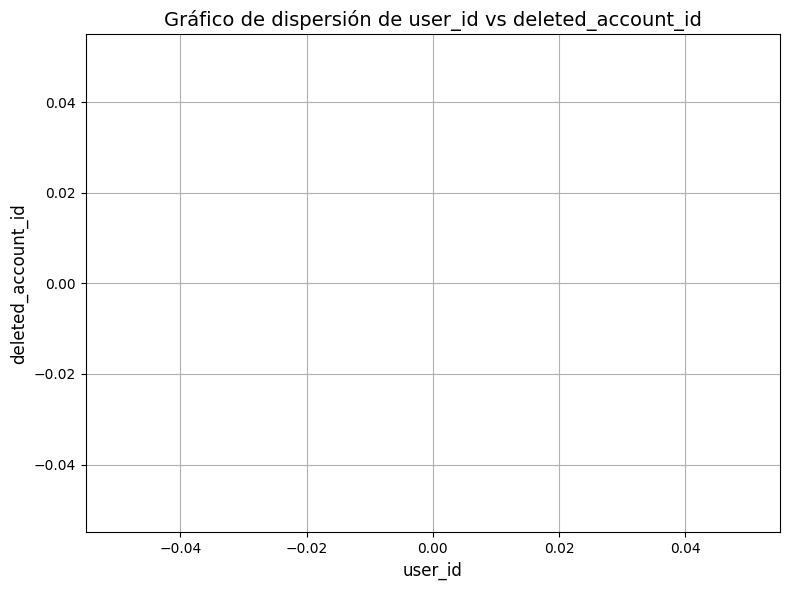

In [40]:
import itertools
import matplotlib.pyplot as plt

# Generar gráficos de dispersión para todas las combinaciones de columnas numéricas
for c1, c2 in itertools.combinations(columnas_numericas_business_payments, 2):
    plt.figure(figsize=(8, 6))
    plt.scatter(business_payments[c1], business_payments[c2], alpha=0.7, edgecolor='k')
    plt.title(f'Gráfico de dispersión de {c1} vs {c2}', fontsize=14)
    plt.xlabel(c1, fontsize=12)
    plt.ylabel(c2, fontsize=12)
    plt.grid(True)
    plt.tight_layout()
    # Mostrar el gráfico
    plt.show()


In [42]:
import itertools
import plotly.express as px

# Generar gráficos de dispersión con línea de tendencia para todas las combinaciones de columnas numéricas
for c1, c2 in itertools.combinations(columnas_numericas_business_payments, 2):
    fig = px.scatter(
        business_payments,
        x=c1,
        y=c2,
        title=f'Gráfico de dispersión de {c1} vs {c2} con línea de tendencia',
        trendline="ols",  # Agregar línea de tendencia (OLS)
        template='plotly_white'  # Estilo limpio
    )
    # Ajustar los rangos y la altura del gráfico
    fig.update_layout(
        height=500,
        xaxis=dict(title=c1, automargin=True),
        yaxis=dict(title=c2, automargin=True)
    )
    # Mostrar el gráfico
    fig.show()



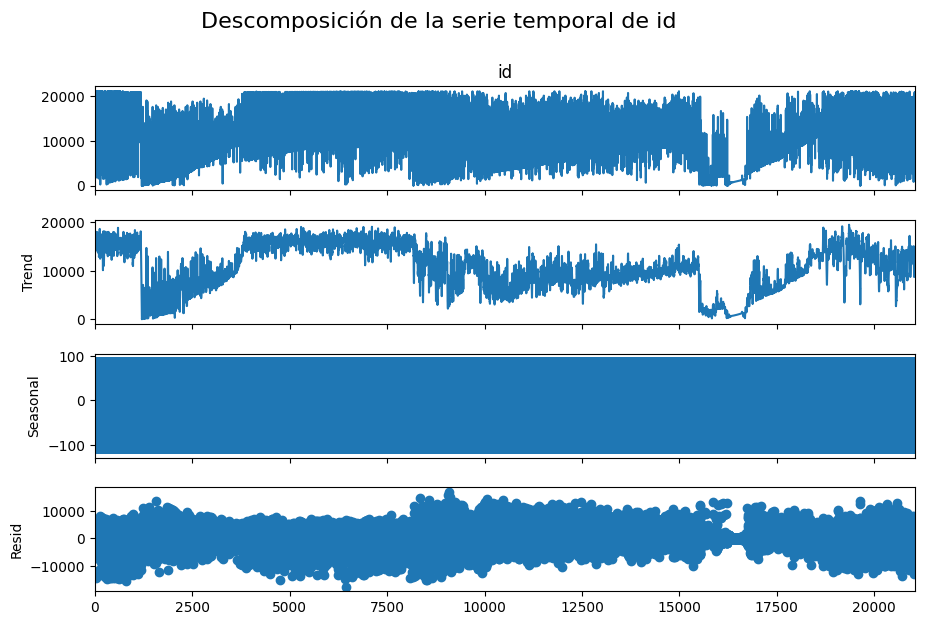

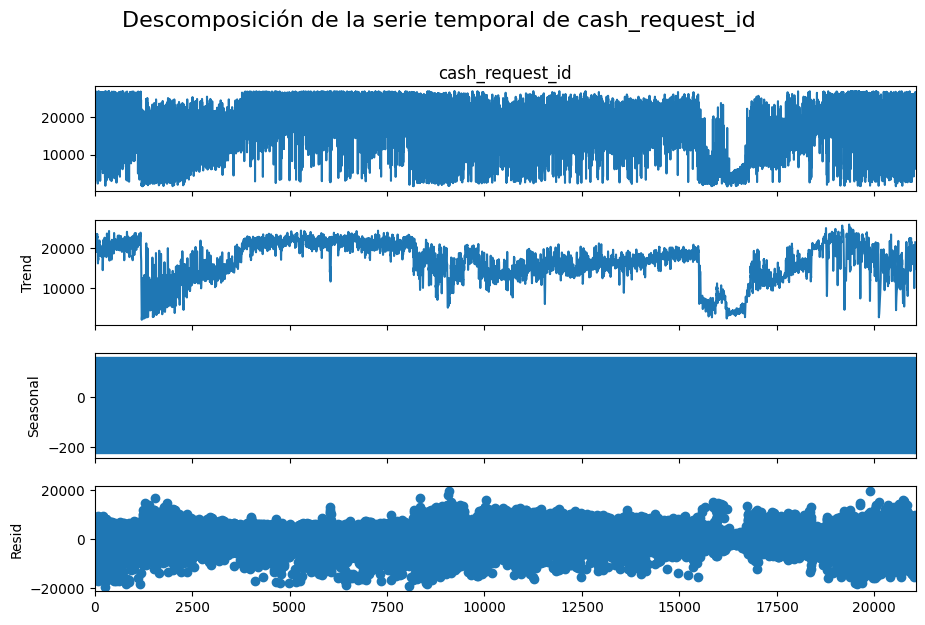

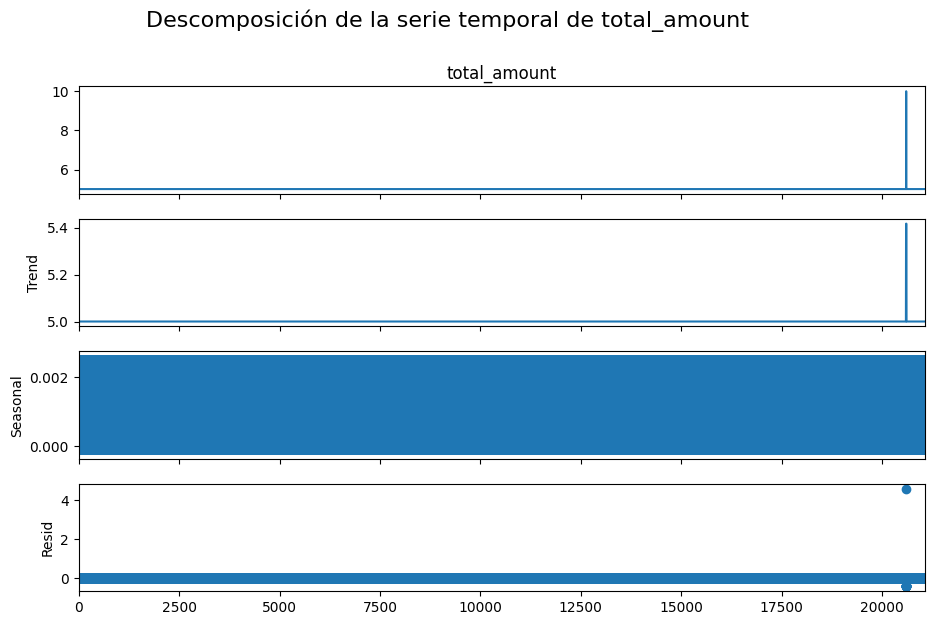

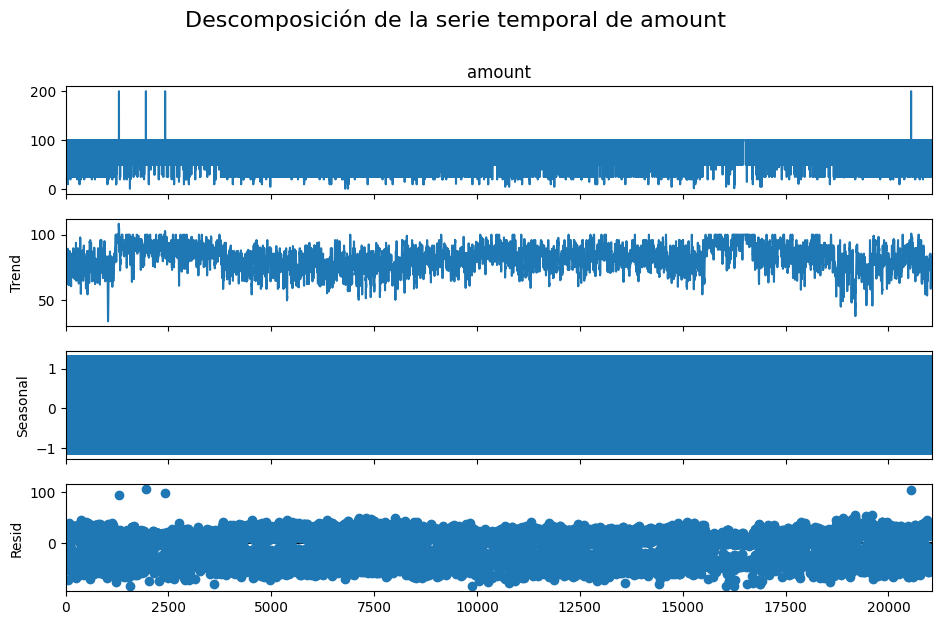

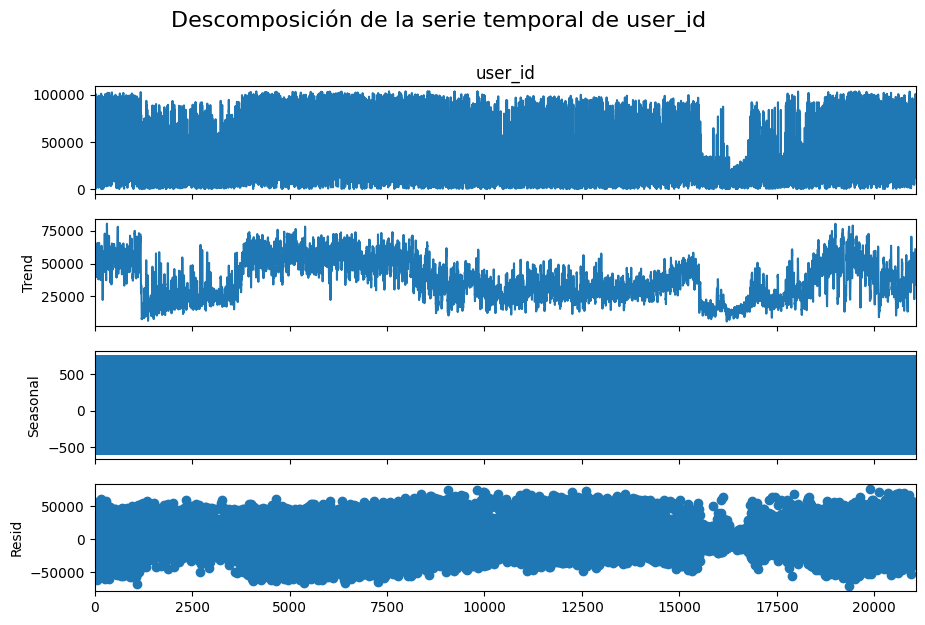

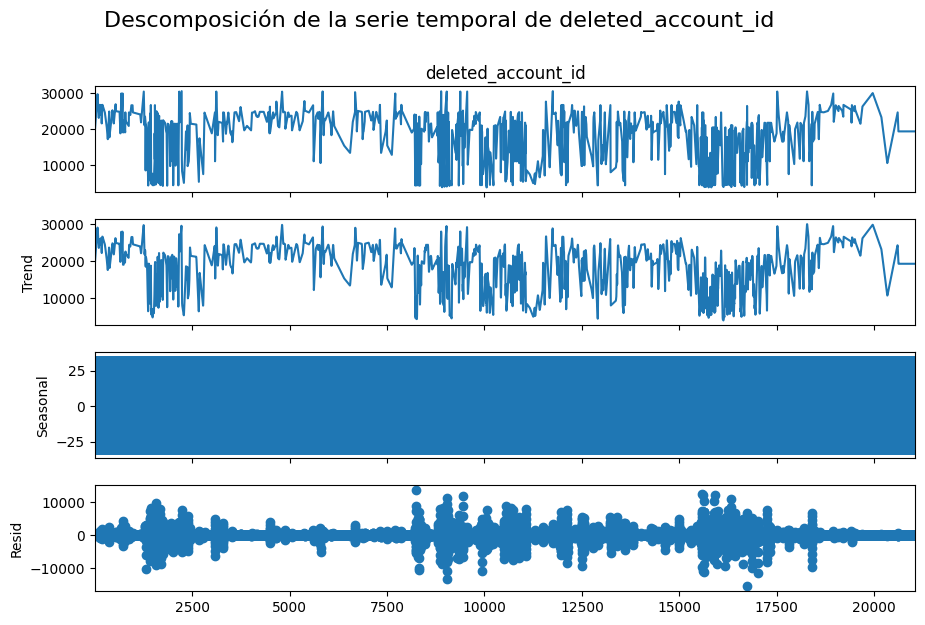

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Descomposición de series temporales para cada columna numérica individual
for columna in columnas_numericas_business_payments:
    # Crear una copia de la columna para trabajar
    serie_temporal = business_payments[columna].copy()

    # Verificar si hay valores faltantes y eliminarlos o interpolarlos
    if serie_temporal.isnull().any():
        serie_temporal = serie_temporal.interpolate()  # Rellenar NaN con interpolación
        serie_temporal = serie_temporal.dropna()  # Eliminar filas con valores faltantes

    # Verificar que no haya valores no finitos
    if not np.isfinite(serie_temporal).all():
        print(f'La columna {columna} contiene valores no finitos, se omite la descomposición.')
        continue

    # Intentar descomponer la serie temporal
    try:
        descomposicion = seasonal_decompose(serie_temporal, model='additive', period=12)

        # Graficar la descomposición
        fig = descomposicion.plot()

        # Ajustar el tamaño de la figura con matplotlib
        plt.gcf().set_size_inches(10, 6)

        # Ajustar el título para que no se superponga
        fig.suptitle(f'Descomposición de la serie temporal de {columna}', fontsize=16, y=1.05)

        # Mostrar el gráfico
        plt.show()
    except ValueError as e:
        print(f"No se pudo descomponer la serie temporal de {columna}: {e}")
